# CARLA Event Data Visualization

Easy-to-use framework for visualizing event camera data from CARLA HDF5 files.

In [61]:
import sys
import h5py
import hdf5plugin
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from tonic.transforms import ToFrame
from IPython.display import HTML

# Add project path
project_path = Path.cwd()
if str(project_path) not in sys.path:
    sys.path.insert(0, str(project_path))

from utils.visualize_utils import animate_events

print("Libraries loaded successfully!")

Libraries loaded successfully!


## Configuration

Set your data paths and visualization parameters here.

In [62]:
# ============================================================
# CONFIGURATION - Modify these values as needed
# ============================================================

# Path to CARLA data folder
DATA_DIR = Path('~/nmv_datasets/CARLA/density_bias_7_tau_30_fs_7')

# File selection mode: 'random', 'path', or 'index'
#   'random' - randomly select a file each time
#   'path'   - use FILE_PATH below
#   'index'  - use FILE_INDEX below
FILE_MODE = 'path'

# Direct path to a specific file (used when FILE_MODE = 'path')
FILE_PATH = '~/nmv_datasets/CARLA/bias_3/test/Town10output46thresh_3_chunk_0049_td.h5'

# File index (used when FILE_MODE = 'index')
FILE_INDEX = 0

# Time window for frame aggregation (microseconds)
# Smaller = more frames, faster playback; Larger = fewer frames, more events per frame
TIME_WINDOW_US = 2000  # 2ms

# Maximum events to load (None = all events)
MAX_EVENTS = None

# Figure size for animations
FIG_SIZE = (10, 8)

# ============================================================

## Helper Functions

In [63]:
import random

# Cache for file list (avoid re-scanning each time)
_file_cache = {}

def clear_file_cache():
    """Clear the file cache (call this after changing DATA_DIR)."""
    global _file_cache
    _file_cache = {}
    print("File cache cleared")


def get_all_files(data_dir: Path) -> list:
    """Get all HDF5 files in data directory (cached)."""
    # Expand ~ and resolve path
    data_dir = Path(data_dir).expanduser().resolve()
    key = str(data_dir)
    if key not in _file_cache:
        if not data_dir.exists():
            print(f"⚠️ Directory does not exist: {data_dir}")
            _file_cache[key] = []
        else:
            _file_cache[key] = sorted(data_dir.rglob('*.h5'))
        print(f"Found {len(_file_cache[key])} HDF5 files in {data_dir}")
    return _file_cache[key]


def find_file_by_name(data_dir: Path, filename: str) -> Path:
    """
    Find a file by name and return its full path. 
    Searches across all splits (train/test/val) regardless of what's in the path.
    Shows which split the file is actually in.
    """
    data_dir = Path(data_dir).expanduser().resolve()
    files = get_all_files(data_dir)
    
    # Extract just the filename if a full path was provided
    if '/' in filename:
        filename = Path(filename).name
    
    # Exact match
    matches = [f for f in files if f.name == filename]
    
    if not matches:
        # Try partial match
        matches = [f for f in files if filename in f.name]
        if matches:
            print(f"No exact match for '{filename}'. Partial matches:")
            for m in matches[:10]:
                print(f"  - {m.parent.name}/{m.name}")
            if len(matches) > 10:
                print(f"  ... and {len(matches) - 10} more")
            return matches[0]
        else:
            print(f"❌ No file found matching '{filename}'")
            return None
    
    if len(matches) == 1:
        f = matches[0]
        print(f"✅ Found: {f.parent.name}/{f.name}")
        return f
    else:
        print(f"Multiple matches for '{filename}':")
        for m in matches:
            print(f"  - {m.parent.name}/{m.name}")
        return matches[0]


def get_random_file(data_dir: Path) -> Path:
    """Get a random file from the data directory."""
    files = get_all_files(data_dir)
    if not files:
        raise FileNotFoundError(f"No HDF5 files found in {data_dir}")
    selected = random.choice(files)
    print(f"🎲 Randomly selected: {selected.parent.name}/{selected.name}")
    return selected


def try_other_splits(file_path: Path) -> Path:
    """
    If file not found, try swapping train/test/val in the path.
    Returns the found path or None.
    """
    path_str = str(file_path)
    splits = ['train', 'test', 'val']
    
    # Find which split is in the current path
    current_split = None
    for split in splits:
        if f'/{split}/' in path_str:
            current_split = split
            break
    
    if not current_split:
        return None
    
    # Try other splits
    other_splits = [s for s in splits if s != current_split]
    for other_split in other_splits:
        new_path_str = path_str.replace(f'/{current_split}/', f'/{other_split}/')
        new_path = Path(new_path_str)
        try:
            with h5py.File(new_path, 'r') as f:
                pass
            print(f"✅ Found in '{other_split}' instead of '{current_split}'")
            return new_path
        except:
            continue
    
    return None


def get_file_path(file_path_str: str = None, data_dir: Path = None, file_index: int = 0) -> Path:
    """
    Get file path by direct path or index.
    If file_path_str is provided but file not found, tries swapping train/test/val in the path.
    """
    if file_path_str:
        path = Path(file_path_str).expanduser().resolve()
        # Try to open directly first (fast path)
        try:
            with h5py.File(path, 'r') as f:
                pass  # File exists and is readable
            return path
        except:
            # File not found - try other splits (train/test/val)
            print(f"⚠️ File not found at specified path, trying other splits...")
            found = try_other_splits(path)
            if found:
                return found
            raise FileNotFoundError(f"File not found: {file_path_str}")
    
    if data_dir:
        files = get_all_files(data_dir)
        if not files:
            raise FileNotFoundError(f"No HDF5 files found in {data_dir}")
        if 0 <= file_index < len(files):
            return files[file_index]
        else:
            raise IndexError(f"File index {file_index} out of range (0-{len(files)-1})")
    
    raise ValueError("Provide either file_path_str or data_dir")


def select_file(mode: str, data_dir: Path, file_path: str = None, file_index: int = 0) -> Path:
    """Select a file based on mode: 'random', 'path', or 'index'."""
    if mode == 'random':
        return get_random_file(data_dir)
    elif mode == 'path':
        return get_file_path(file_path_str=file_path)
    elif mode == 'index':
        return get_file_path(data_dir=data_dir, file_index=file_index)
    else:
        raise ValueError(f"Unknown mode: {mode}. Use 'random', 'path', or 'index'")


def search_files(data_dir: Path, pattern: str) -> list:
    """Search for files matching a pattern (e.g., 'Town01', 'chunk_001')."""
    data_dir = Path(data_dir).expanduser().resolve()
    files = sorted(data_dir.rglob(f'*{pattern}*.h5'))
    print(f"Found {len(files)} files matching '*{pattern}*':")
    for i, f in enumerate(files[:20]):
        print(f"  [{i}] {f.parent.name}/{f.name}")
    if len(files) > 20:
        print(f"  ... and {len(files) - 20} more")
    return files


def load_events(h5_path: Path, max_events: int = None) -> np.ndarray:
    """Load events from an HDF5 file."""
    h5_path = Path(h5_path).expanduser().resolve()
    with h5py.File(h5_path, 'r') as f:
        if 'events' in f and isinstance(f['events'], h5py.Dataset):
            events = f['events'][:max_events] if max_events else f['events'][()]
        elif 'events' in f and isinstance(f['events'], h5py.Group):
            n = max_events if max_events else f['events/x'].shape[0]
            x = f['events/x'][:n]
            y = f['events/y'][:n]
            t = f['events/t'][:n]
            p = f['events/p'][:n]
            dtype = np.dtype([('x', '<i2'), ('y', '<i2'), ('t', '<i8'), ('p', '?')])
            events = np.empty(n, dtype=dtype)
            events['x'] = x
            events['y'] = y
            events['t'] = t
            events['p'] = p
        else:
            raise ValueError(f"Unknown HDF5 structure in {h5_path}")
    
    print(f"  Events: {len(events):,} | Duration: {(events['t'].max() - events['t'].min()) / 1e6:.2f}s")
    return events


def get_sensor_size(events: np.ndarray) -> tuple:
    """Infer sensor size from events."""
    return (int(events['x'].max()) + 1, int(events['y'].max()) + 1, 2)


def visualize_animation(events: np.ndarray, time_window: int = 50000, fig_size: tuple = (10, 8)):
    """Create an animation from events."""
    sensor_size = get_sensor_size(events)
    to_frame = ToFrame(sensor_size=sensor_size, time_window=time_window)
    anim = animate_events(events, to_frame, fig_size=fig_size)
    return HTML(anim.to_jshtml())


def visualize_frames(events: np.ndarray, time_window: int = 50000, num_frames: int = 6, cols: int = 3):
    """Display a grid of frames from events."""
    sensor_size = get_sensor_size(events)
    to_frame = ToFrame(sensor_size=sensor_size, time_window=time_window)
    frames = to_frame(events)
    
    num_frames = min(num_frames, len(frames))
    rows = (num_frames + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = np.atleast_2d(axes).flatten()
    
    for i, ax in enumerate(axes):
        if i < num_frames:
            rgb = np.zeros((*frames[i, 0].shape, 3))
            rgb[..., 0] = frames[i, 0] > 0
            rgb[..., 2] = frames[i, 1] > 0
            ax.imshow(rgb)
            ax.set_title(f'Frame {i}')
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()


def visualize_scatter(events: np.ndarray, max_points: int = 50000):
    """Create a scatter plot of events."""
    n = min(len(events), max_points)
    x, y, p = events['x'][:n], events['y'][:n], events['p'][:n]
    
    fig, ax = plt.subplots(figsize=(10, 8))
    colors = np.where(p, 'red', 'blue')
    ax.scatter(x, y, c=colors, s=0.5, alpha=0.5)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.invert_yaxis()
    ax.set_title(f'Event Scatter Plot ({n:,} events)')
    ax.set_aspect('equal')
    plt.tight_layout()
    plt.show()

## Load Events (for fixed file mode)

This cell loads events once. Use this when `FILE_MODE = 'path'` or `'index'`.
For random mode, skip this and use the visualization cells below which load a new random file each time.

In [64]:
# Load events (for fixed file mode - path or index)
# Skip this cell if using random mode
selected_file = select_file(FILE_MODE, DATA_DIR, FILE_PATH, FILE_INDEX)
print(f"📁 File: {selected_file}")
events = load_events(selected_file, max_events=MAX_EVENTS)

⚠️ File not found at specified path, trying other splits...
✅ Found in 'train' instead of 'test'
📁 File: /home/hesam/nmv_datasets/CARLA/bias_3/train/Town10output46thresh_3_chunk_0049_td.h5
  Events: 1,714,412 | Duration: 0.10s


## Visualization Options

**Random mode:** Each cell below loads a NEW random file when re-run.
**Fixed mode:** Uses the `events` variable loaded above.

📁 Visualizing: /home/hesam/nmv_datasets/CARLA/bias_3/train/Town10output46thresh_3_chunk_0049_td.h5


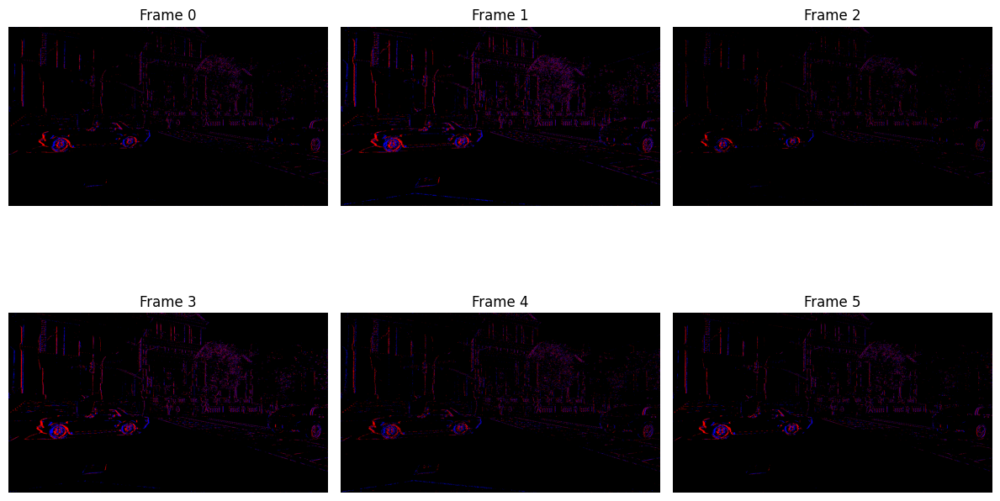

In [65]:
# Re-run this cell for a new random file (when FILE_MODE='random')
if FILE_MODE == 'random':
    selected_file = get_random_file(DATA_DIR)
    events = load_events(selected_file, max_events=MAX_EVENTS)

print(f"📁 Visualizing: {selected_file}")
visualize_frames(events, time_window=TIME_WINDOW_US, num_frames=6, cols=3)

### Option A: Static Frame Grid

📁 Visualizing: /home/hesam/nmv_datasets/CARLA/bias_3/train/Town10output46thresh_3_chunk_0049_td.h5


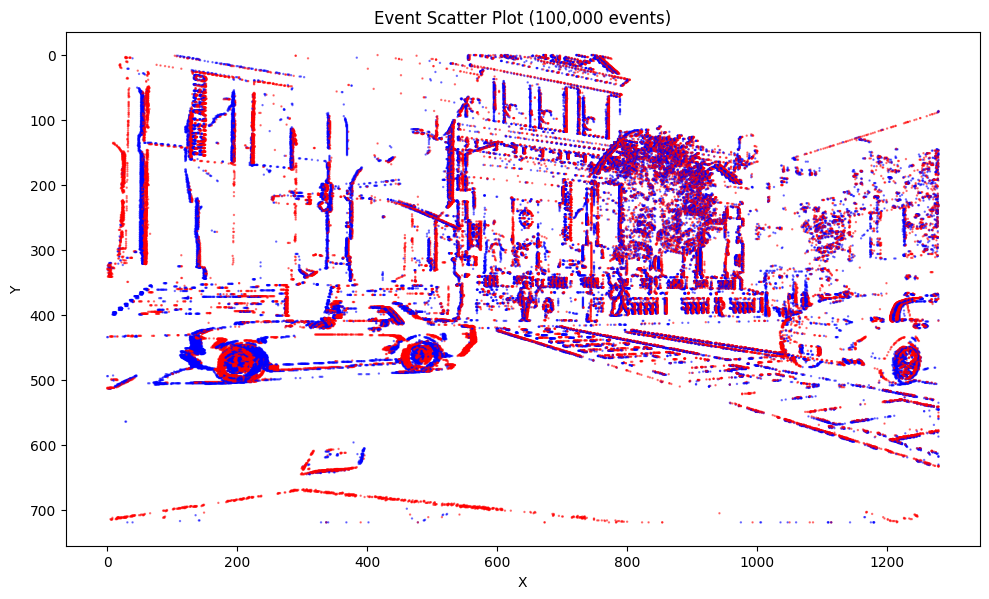

In [66]:
# Re-run this cell for a new random file (when FILE_MODE='random')
if FILE_MODE == 'random':
    selected_file = get_random_file(DATA_DIR)
    events = load_events(selected_file, max_events=MAX_EVENTS)

print(f"📁 Visualizing: {selected_file}")
visualize_scatter(events, max_points=100000)

### Option B: Scatter Plot

In [67]:
# Re-run this cell for a new random file (when FILE_MODE='random')
if FILE_MODE == 'random':
    selected_file = get_random_file(DATA_DIR)
    events = load_events(selected_file, max_events=MAX_EVENTS)

print(f"📁 Visualizing: {selected_file}")
visualize_animation(events, time_window=TIME_WINDOW_US, fig_size=FIG_SIZE)

📁 Visualizing: /home/hesam/nmv_datasets/CARLA/bias_3/train/Town10output46thresh_3_chunk_0049_td.h5


## Compare Multiple Files

Compare events from multiple random or specified files side by side.

Found 16146 HDF5 files in /home/hesam/nmv_datasets/CARLA/density_bias_7_tau_30_fs_7
🎲 Comparing 3 random files:
   - Town05output40thresh_3_chunk_0065_td.h5
   - Town01output53thresh_3_chunk_0022_td.h5
   - Town01output12thresh_3_chunk_0070_td.h5
  Events: 2,201 | Duration: 0.10s
  Events: 26,954 | Duration: 0.11s
  Events: 57,007 | Duration: 0.10s


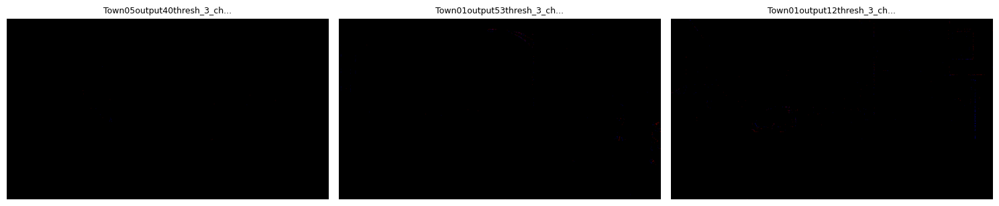

In [68]:
def compare_random_files(data_dir: Path, num_files: int = 3, time_window: int = 50000, frame_idx: int = 0):
    """Compare the same frame from N randomly selected files."""
    data_dir = Path(data_dir).expanduser().resolve()
    files = get_all_files(data_dir)
    if not files:
        raise FileNotFoundError(f"No HDF5 files found in {data_dir}")
    selected = random.sample(files, min(num_files, len(files)))
    
    print(f"🎲 Comparing {len(selected)} random files:")
    for f in selected:
        print(f"   - {f.name}")
    
    fig, axes = plt.subplots(1, len(selected), figsize=(5 * len(selected), 5))
    if len(selected) == 1:
        axes = [axes]
    
    for i, fpath in enumerate(selected):
        ev = load_events(fpath, max_events=MAX_EVENTS)
        sensor_size = get_sensor_size(ev)
        to_frame = ToFrame(sensor_size=sensor_size, time_window=time_window)
        frames = to_frame(ev)
        
        if frame_idx < len(frames):
            rgb = np.zeros((*frames[frame_idx, 0].shape, 3))
            rgb[..., 0] = frames[frame_idx, 0] > 0
            rgb[..., 2] = frames[frame_idx, 1] > 0
            axes[i].imshow(rgb)
        
        name = fpath.name
        axes[i].set_title(name[:25] + '...' if len(name) > 25 else name, fontsize=9)
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()


def compare_files(file_paths: list, time_window: int = 50000, frame_idx: int = 0):
    """Compare the same frame from multiple files. Takes list of path strings."""
    n = len(file_paths)
    fig, axes = plt.subplots(1, n, figsize=(5 * n, 5))
    if n == 1:
        axes = [axes]
    
    for i, fpath in enumerate(file_paths):
        path = Path(fpath).expanduser().resolve()
        ev = load_events(path, max_events=MAX_EVENTS)
        sensor_size = get_sensor_size(ev)
        to_frame = ToFrame(sensor_size=sensor_size, time_window=time_window)
        frames = to_frame(ev)
        
        if frame_idx < len(frames):
            rgb = np.zeros((*frames[frame_idx, 0].shape, 3))
            rgb[..., 0] = frames[frame_idx, 0] > 0
            rgb[..., 2] = frames[frame_idx, 1] > 0
            axes[i].imshow(rgb)
        
        name = path.name
        axes[i].set_title(name[:25] + '...' if len(name) > 25 else name, fontsize=9)
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()


# Compare 3 random files - re-run for new random selection
compare_random_files(DATA_DIR, num_files=3, time_window=TIME_WINDOW_US, frame_idx=5)